In [ ]:
# 1. yt-dlp 설치
!pip install yt-dlp --quiet

# 2. 유튜브 영상 다운로드 (MP4)
import os

url = "https://www.youtube.com/watch?v=HTthpM84ILQ"  # 유튜브 링크

# 저장 경로 및 파일명 지정
output_path = "video.mp4"
!yt-dlp -f bestvideo[ext=mp4]+bestaudio[ext=m4a]/mp4 --merge-output-format mp4 -o "{output_path}" "{url}"

print("✅ yt-dlp로 영상 다운로드 완료!")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 174.3/174.3 kB 1.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 22.9 MB/s eta 0:00:00
[youtube] Extracting URL: https://www.youtube.com/watch?v=HTthpM84ILQ
[youtube] HTthpM84ILQ: Downloading webpage
[youtube] HTthpM84ILQ: Downloading tv client config
[youtube] HTthpM84ILQ: Downloading player 59b252b9-main
[youtube] HTthpM84ILQ: Downloading tv player API JSON
[youtube] HTthpM84ILQ: Downloading ios player API JSON
[youtube] HTthpM84ILQ: Downloading m3u8 information
[info] HTthpM84ILQ: Downloading 1 format(s): 616+140
[hlsnative] Downloading m3u8 manifest
[hlsnative] Total fragments: 62
[download] Destination: video.f616.mp4
[download] 100% of   32.72MiB in 00:00:06 at 4.70MiB/s
[download] Destination: video.f140.m4a
[download] 100% of    5.20MiB in 00:00:00 at 10.07MiB/s
[Merger] Merging formats into "video.mp4"
Deleting original file video.f616.mp4 (pass -k to keep)
Deleting original file video.f140.m4a (pass -k to 

In [ ]:
import cv2

cap = cv2.VideoCapture("video.mp4")
fps = cap.get(cv2.CAP_PROP_FPS)
frame_count = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
duration = frame_count / fps

print(f"🎥 영상 프레임 수: {frame_count}")
print(f"🎞 FPS: {fps}")
print(f"⏱ 영상 길이 (초): {duration:.2f}")
cap.release()

🎥 영상 프레임 수: 10094
🎞 FPS: 29.97000846562182
⏱ 영상 길이 (초): 336.80


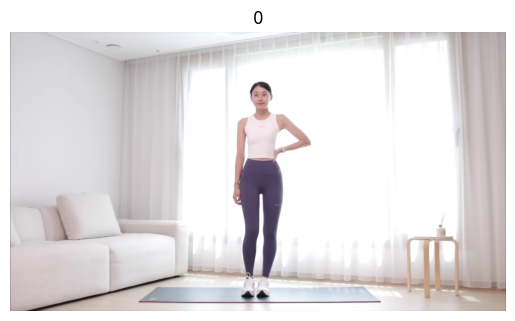

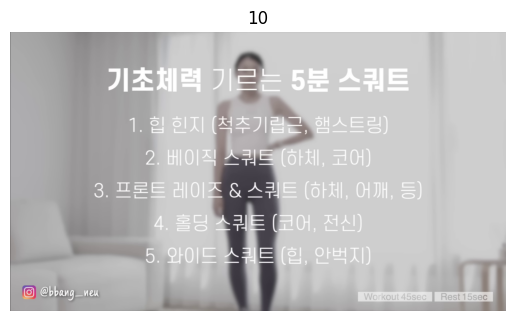

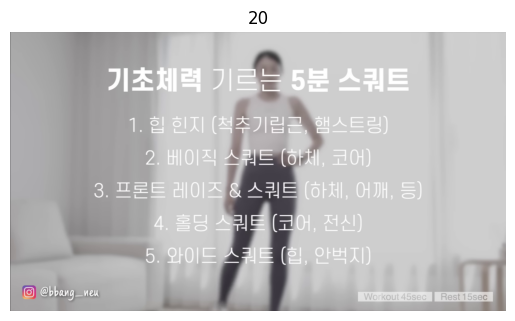

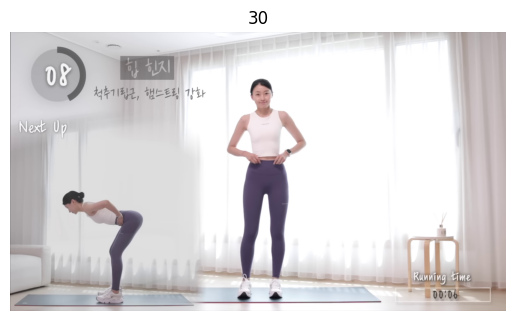

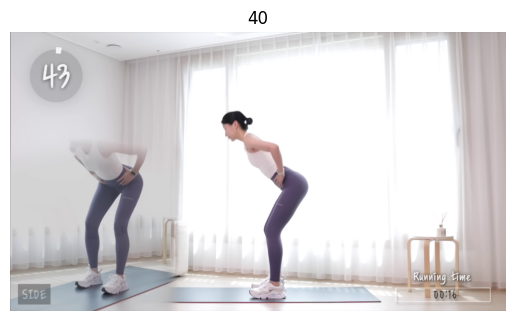

...

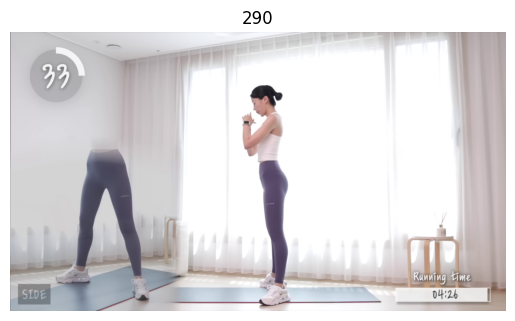

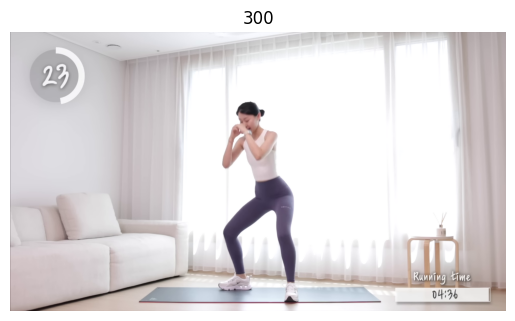

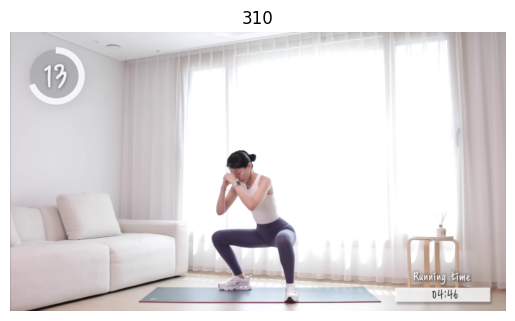

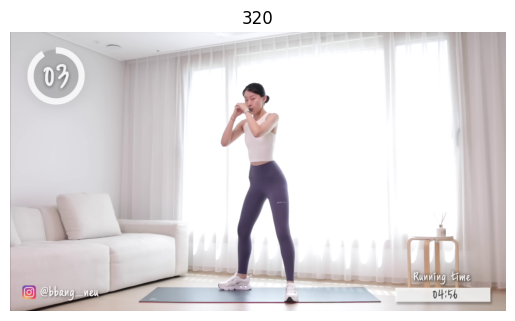

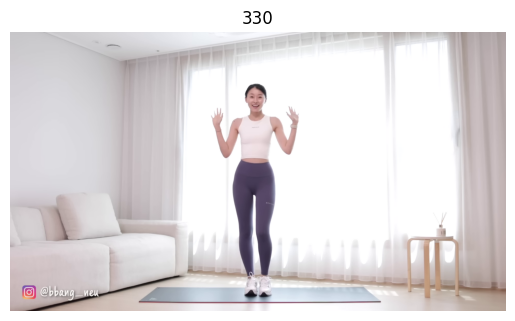

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation

# 10초 단위 썸네일 확인 (앞부분부터 확인)
cap = cv2.VideoCapture("video.mp4")
for sec in range(0, int(duration), 10):
    cap.set(cv2.CAP_PROP_POS_MSEC, sec * 1000)
    ret, frame = cap.read()
    if ret:
        plt.imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        plt.title(f"{sec}")
        plt.axis('off')
        plt.show()
cap.release()


In [ ]:
!pip uninstall -y mediapipe
!pip install mediapipe==0.10.9

Found existing installation: mediapipe 0.10.21
Uninstalling mediapipe-0.10.21:
  Successfully uninstalled mediapipe-0.10.21
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 34.5/34.5 MB 32.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 162.1/162.1 kB 10.3 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.7
    Uninstalling protobuf-4.25.7:
      Successfully uninstalled protobuf-4.25.7
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-metadata 1.17.1 requires protobuf<6.0.0,>=4.25.2; python_version >= "3.11", but you have protobuf 3.20.3 which is incompatible.
ydf 0.11.0 requires protobuf<6.0.0,>=5.29.1, but you have protobuf 3.20.3 which is incompatible.
grpcio-status 1.71.0 requires protobuf<6.0dev,>=5.26.1, but you have protobuf 3.20.3 which is incompatible.


In [ ]:
# 재시작 후 제일 먼저!
!pip install mediapipe==0.10.9

In [ ]:
import mediapipe as mp
from mediapipe.tasks import python
from mediapipe.tasks.python import vision

In [ ]:
# 📚 import
import numpy as np
import cv2

# 📌 모델 초기화
base_options = python.BaseOptions(model_asset_path='pose_landmarker.task')
options = vision.PoseLandmarkerOptions(
    base_options=base_options,
    output_segmentation_masks=False,
    running_mode=vision.RunningMode.IMAGE
)
detector = vision.PoseLandmarker.create_from_options(options)

In [ ]:
# ✔️ 3. 포즈 추출 (30~40초, 초당 10장 샘플링)
import cv2
import numpy as np

# 설정
start_time = 90   # 분석 시작 시점 (초)
end_time = 120     # 분석 끝 시점 (초)
target_fps = 10   # 초당 몇 장 뽑을지 (원래 30fps면 3프레임마다 1장)

# Mediapipe Pose 초기화
mp_pose = mp.solutions.pose
pose = mp_pose.Pose()

In [ ]:
# 영상 열기
cap = cv2.VideoCapture("video.mp4")
fps = cap.get(cv2.CAP_PROP_FPS)
start_frame = int(start_time * fps)
end_frame = int(end_time * fps)
step = max(1, int(fps / target_fps))  # 프레임 샘플링 간격 계산

# 포즈 저장 리스트
landmark_list = []
frame_idx = 0

# 영상 루프
while cap.isOpened():
    ret, frame = cap.read()
    if not ret or frame_idx > end_frame:
        break

    if frame_idx >= start_frame and (frame_idx - start_frame) % step == 0:
        image = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        results = pose.process(image)

        if results.pose_landmarks:
            landmarks = [[lm.x, lm.y, lm.z] for lm in results.pose_landmarks.landmark]
            landmark_list.append(landmarks)

    frame_idx += 1

cap.release()
print("✅ 포즈 추출 완료!")

# ✔️ 4. 결과 확인
landmark_array = np.array(landmark_list)
print("총 추출 프레임 수:", landmark_array.shape[0])
print("관절 수:", landmark_array.shape[1])
print("예시: 첫 프레임의 왼쪽 무릎 (25번) 좌표:", landmark_array[0][25])  # 왼쪽 무릎 = index 25

✅ 포즈 추출 완료!
총 추출 프레임 수: 450
관절 수: 33
예시: 첫 프레임의 왼쪽 무릎 (25번) 좌표: [ 0.52367383  0.71291691 -0.05095844]


In [ ]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation

fig, ax = plt.subplots(figsize=(5, 5))

# 관절 연결
mp_pose = mp.solutions.pose
connections = mp_pose.POSE_CONNECTIONS

# 점 & 선 초기화
points, = ax.plot([], [], 'ro', markersize=4)
lines = [ax.plot([], [], 'b-')[0] for _ in connections]

def init():
    ax.set_xlim(0, 1)
    ax.set_ylim(1, 0)
    ax.axis('off')
    return [points] + lines

def update(frame_idx):
    landmarks = landmark_list[frame_idx]
    xs = [lm[0] for lm in landmarks]
    ys = [lm[1] for lm in landmarks]

    # 점 위치 업데이트
    points.set_data(xs, ys)

    # 선 연결 업데이트
    for i, (start, end) in enumerate(connections):
        x_line = [landmarks[start][0], landmarks[end][0]]
        y_line = [landmarks[start][1], landmarks[end][1]]
        lines[i].set_data(x_line, y_line)

    return [points] + lines

ani = animation.FuncAnimation(fig, update, frames=len(landmark_list), init_func=init, interval=50, blit=True)
plt.close()

from IPython.display import HTML
HTML(ani.to_jshtml())


In [ ]:
reference_pose = np.array(landmark_list)
np.save("reference_pose.npy", reference_pose)